<a href="https://colab.research.google.com/github/sanggusti/mentoring-skilvul-sic/blob/main/OpenCV_Tutorial_with_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **About OpenCV**
* Officially launched in 1999, OpenCV (Open Source Computer Vision) from an Intel initiative.
* OpenCV’s core is written in C++. In python we are simply using a wrapper that executes C++ code inside of python.
* First major release 1.0 was in 2006, second in 2009, third in 2015 and 4th in 2018. with OpenCV 4.0 Beta.
* It is an Open source library containing over 2500 optimized algorithms.
* It is EXTREMELY useful for almost all computer vision applications and is supported on Windows, Linux, MacOS, Android, iOS with bindings to Python, Java and Matlab.





# OpenCV Basics - Phase 1

## Import necessary Library for Open CV

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

## RGB to Grayscale



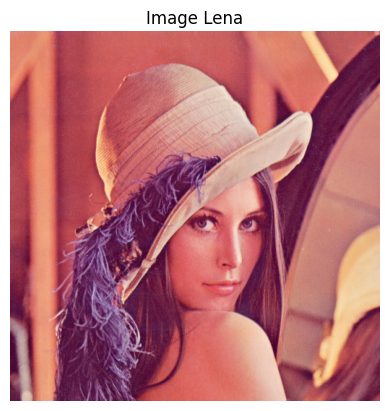

In [ ]:
# read the image using OpenCV

img = cv2.imread("/content/image_data/lena.jpg")

# convert the color from BGR to RGB for displaying using matplotlib
lena_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image using matplotlib
plt.imshow(lena_img)
plt.title('Image Lena')
plt.axis('off')
plt.show()



Grayscale images save space and simplify processing, making them a popular choice for computer vision tasks like object detection (in Python with OpenCV).



In [ ]:
# Converting the lena image to grayscale
gray_img = cv2.cvtColor(lena_img, cv2.COLOR_RGB2GRAY)

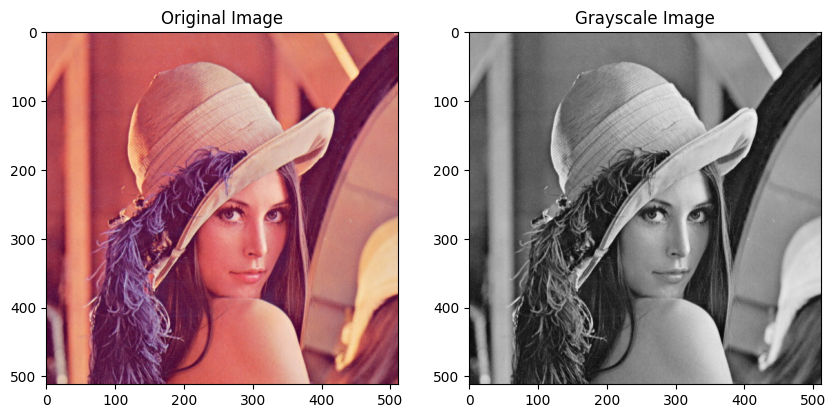

In [ ]:
# Displaying and comparing the results
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(lena_img)
axs[0].set_title('Original Image')
axs[1].imshow(gray_img, cmap='gray')
axs[1].set_title('Grayscale Image')
plt.show()

## Scaling, re-sizing and interpolations


In [ ]:
# Let's Use Fruits image
fruits_img = cv2.imread("/content/image_data/fruits.jpg")
fruits_img = cv2.cvtColor(fruits_img, cv2.COLOR_BGR2RGB)

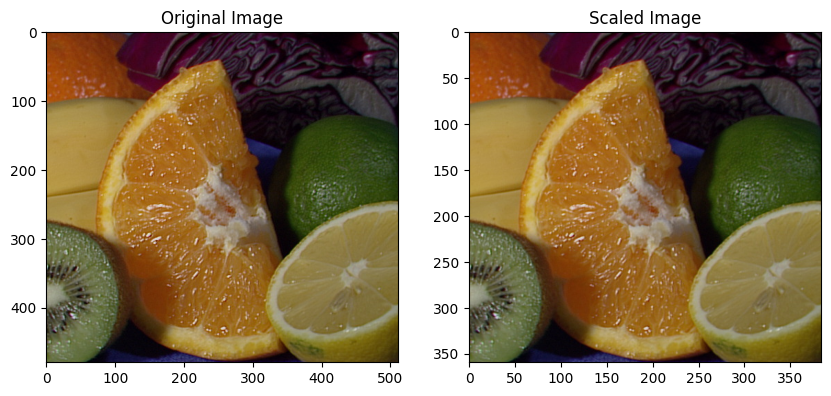

In [ ]:
# Resize image 75% of the original size
img_scaled = cv2.resize(fruits_img, None, fx=0.75, fy=0.75)

# Visualize original vs scaled image
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(fruits_img)
axs[0].set_title('Original Image')
axs[1].imshow(img_scaled)
axs[1].set_title('Scaled Image')

plt.show()


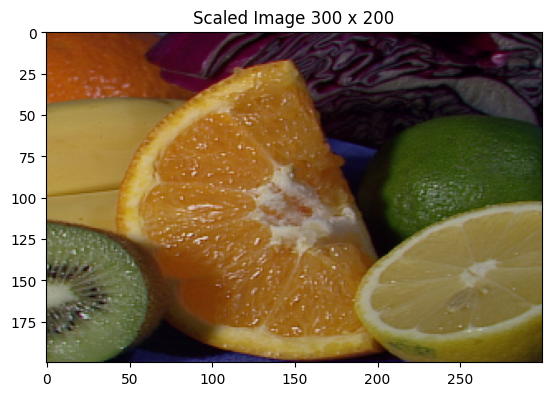

In [ ]:
# Scale image to specific pixel (300x200)
img_scaled_static = cv2.resize(fruits_img, (300, 200))

# Show image
plt.imshow(img_scaled_static)
plt.title('Scaled Image 300 x 200')
plt.show()

## Image Masking

In computer vision, image masking lets you focus on specific areas (ROI) by creating a separate image that isolates them for further processing.

In [ ]:
# We are still using lena image
img = cv2.imread("/content/image_data/lena.jpg")
# Create a black mask with the same size as the image
mask = np.zeros(img.shape[:2], dtype=np.uint8)


In [ ]:
# Define the center and radius of the circle
height, width = img.shape[:2]
center = (width // 2, height // 2)
radius = min(height, width) // 4

In [ ]:
# Draw a white circle in the mask
cv2.circle(mask, center, radius, (255, 255, 255), -1)

# Apply the mask to the image
masked_img = cv2.bitwise_and(img, img, mask=mask)

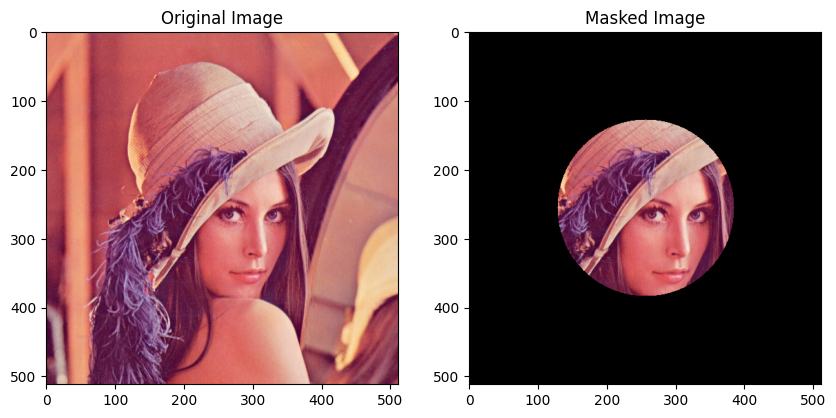

In [ ]:
# Display the original image with the circular mask
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv2.cvtColor(masked_img, cv2.COLOR_BGR2RGB))
ax[1].set_title('Masked Image')
plt.show()

## Color Histogram
An image color histogram, created using OpenCV, is a graph that reveals the color distribution (how often each color appears) in an image, useful for tasks like segmentation and object recognition.


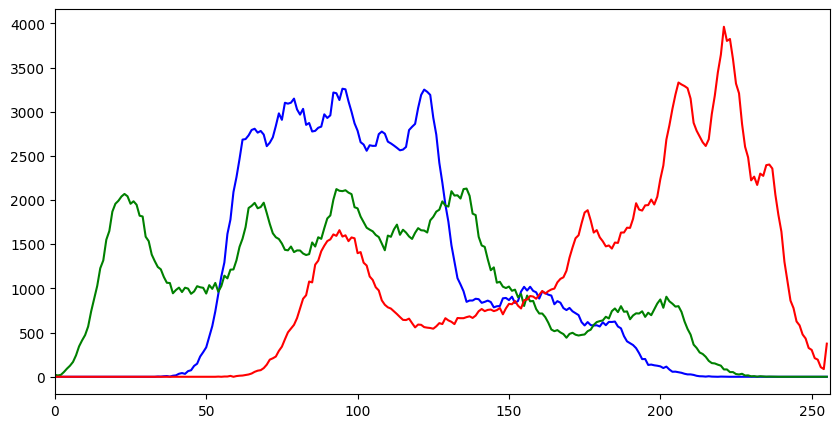

In [ ]:
# Get the Lena Image
img = cv2.imread("/content/image_data/lena.jpg")

# Plotting the histogram of a color image
color = ('b', 'g', 'r')
plt.figure(figsize=(10, 5))
for i, col in enumerate(color):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
    plt.xlim([0, 256])
plt.show()

## Sharpening
By altering our kernels we can implement sharpening, which has the effects of in strengthening or emphasizing edges in an image.

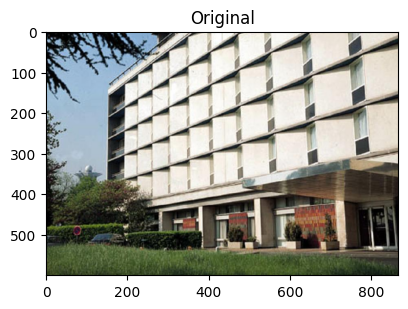

In [ ]:
# We are using data building
image = cv2.imread('/content/image_data/building.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)

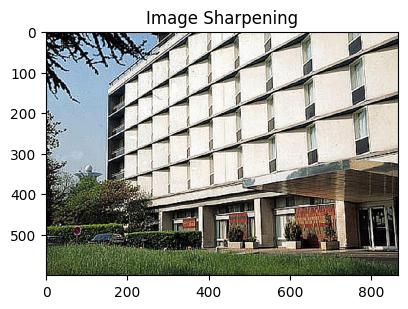

In [ ]:
# Create our shapening kernel, we don't normalize since the
# the values in the matrix sum to 1
kernel_sharpening = np.array([[-1,-1,-1],
                              [-1,9,-1],
                              [-1,-1,-1]])

# applying different kernels to the input image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(sharpened)

plt.show()

## Blurring

Image blurring in OpenCV (averaging, Gaussian, median) reduces noise, smooths edges, or hides details by replacing pixels with a weighted average of their neighbors.


In [ ]:
# Get the lena image
img = cv2.imread("/content/image_data/lena.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


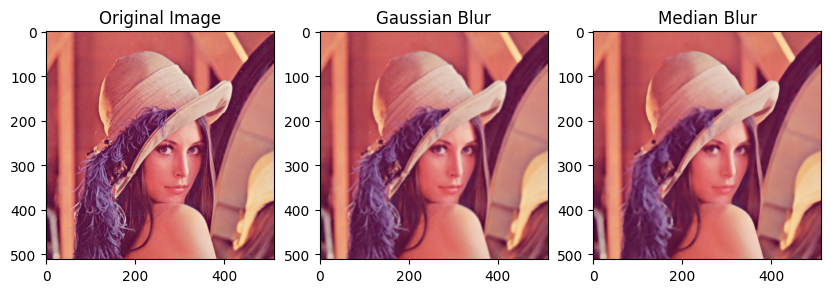

In [ ]:
# Create figure for display images for comparison multiple blurring techniques
fig, ax = plt.subplots(1, 3, figsize=(10, 10))

# Original Image
ax[0].imshow(img)
ax[0].set_title('Original Image')

# Apply gaussian blur
blur = cv2.GaussianBlur(img, (5, 5), 0)
ax[1].imshow(blur)
ax[1].set_title('Gaussian Blur')

# Apply median blur
median = cv2.medianBlur(img, 7)
ax[2].imshow(median)
ax[2].set_title('Median Blur')

# Visualize Result
plt.show()


## Thresholding Image

OpenCV offers various image thresholding techniques (Simple, Adaptive, Otsu's) that convert grayscale or color images to black and white (binary) to highlight key features like edges and shapes, useful for object detection, segmentation, and recognition.


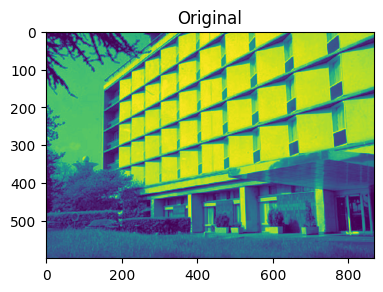

In [ ]:
# Load our building image
image = cv2.imread('/content/image_data/building.jpg',cv2.IMREAD_GRAYSCALE)

# Plot the image
plt.figure(figsize=(10, 10))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)


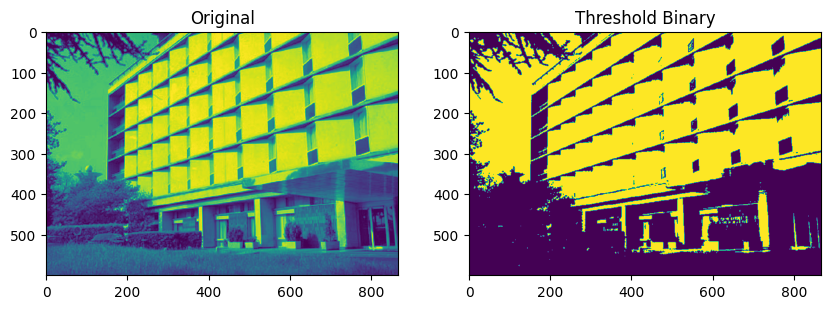

In [ ]:
# Threshold Binary

# Values below 127 goes to 0 (black, everything above goes to 255 (white)
ret,thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Plot original vs threshold binary image
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(image)
axs[0].set_title('Original')
axs[1].imshow(thresh1)
axs[1].set_title('Threshold Binary')
plt.show()

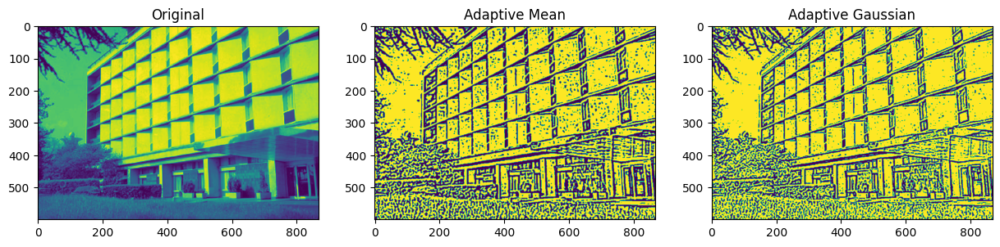

In [ ]:
# It's good practice to blur images as it removes noise
blurred_image = cv2.medianBlur(image,5)

# Adaptive Threshold Mean
thresh2 = cv2.adaptiveThreshold(blurred_image,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
 cv2.THRESH_BINARY,11,2)

# Adaptive Threshold Gaussian
thresh3 = cv2.adaptiveThreshold(blurred_image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
 cv2.THRESH_BINARY,11,2)

# Plot original vs Adaptive Threshold ( Mean & Gaussian )
fig, axs = plt.subplots(1, 3, figsize=(15, 10))
axs[0].imshow(image)
axs[0].set_title('Original')
axs[1].imshow(thresh2)
axs[1].set_title('Adaptive Mean')
axs[2].imshow(thresh3)
axs[2].set_title('Adaptive Gaussian')
plt.show()




## Morphological Operations

OpenCV's image morphological operations (erosion, dilation, etc.) analyze image shapes by shrinking or expanding objects and are used for noise reduction, enhancement, and object recognition in computer vision.


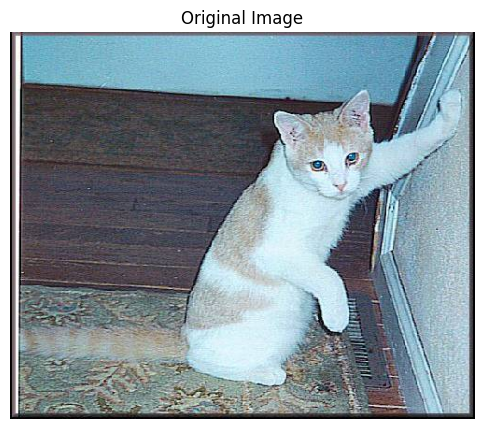

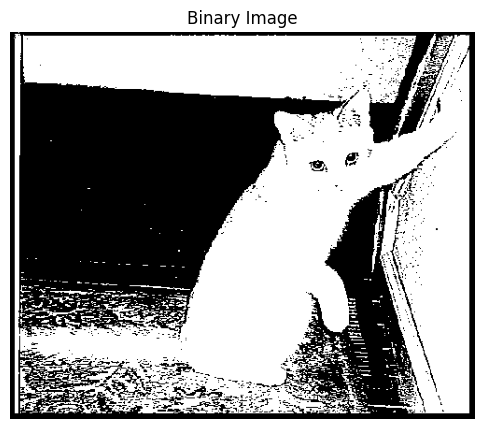

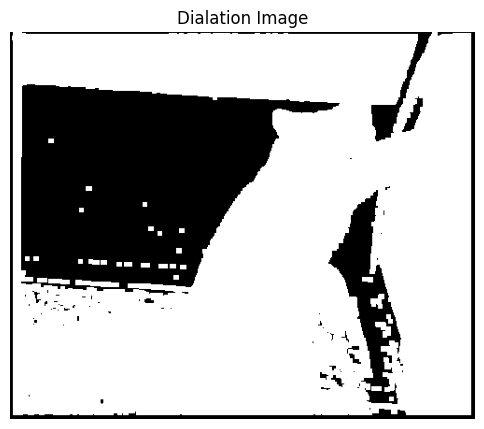

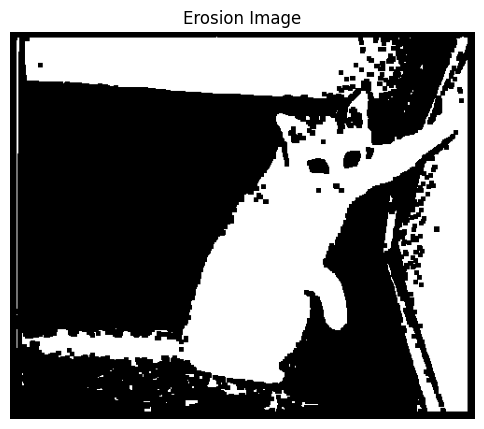

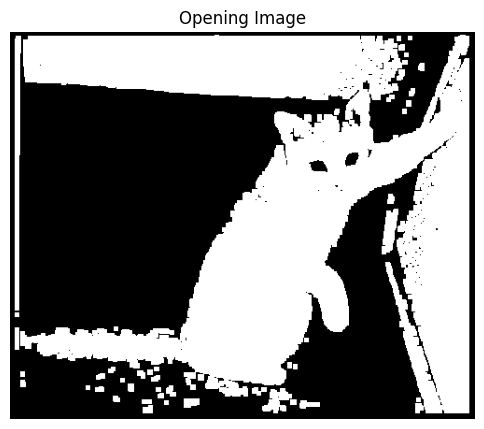

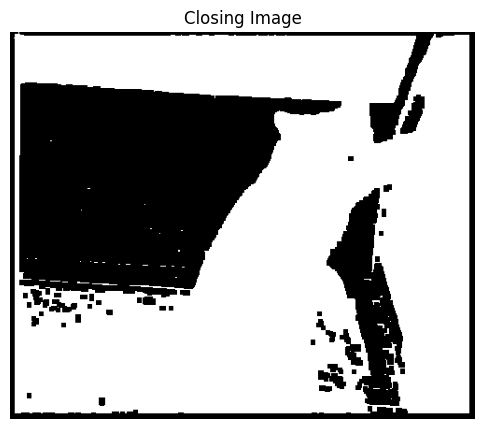

In [ ]:
img = cv2.imread('/content/image_data/cat.4001.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding to obtain a binary image
ret, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# Define the structuring element
kernel = np.ones((5,5), np.uint8)

# Apply dilation to the binary image
dilation = cv2.dilate(binary, kernel, iterations=1)

# Apply erosion to the binary image
erosion = cv2.erode(binary, kernel, iterations=1)

# Apply opening to the binary image
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

# Apply closing to the binary image
closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

# Display the original image and processed images using matplotlib
fig = plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(6, 6))
plt.imshow(binary, cmap='gray')
plt.title('Binary Image')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(6, 6))
plt.imshow(dilation, cmap='gray')
plt.title('Dialation Image')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(6, 6))
plt.imshow(erosion, cmap='gray')
plt.title('Erosion Image')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(6, 6))
plt.imshow(opening, cmap='gray')
plt.title('Opening Image')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(6, 6))
plt.imshow(closing, cmap='gray')
plt.title('Closing Image')
plt.axis('off')
plt.show()

# OpenCV Advance - Phase 2


## Edge Detection

OpenCV offers various image edge detection techniques like Canny, Sobel, and Laplacian filters. These methods identify sudden changes in pixel intensity, revealing the boundaries of objects within an image. This information is crucial for computer vision tasks such as object recognition, segmentation, and tracking



In [ ]:
fruits_img2 = cv2.imread("/content/image_data/fruits.jpg")
fruits_img2 = cv2.cvtColor(fruits_img2, cv2.COLOR_BGR2RGB)

height, width,_ = fruits_img2.shape
print(height,width)

480 512


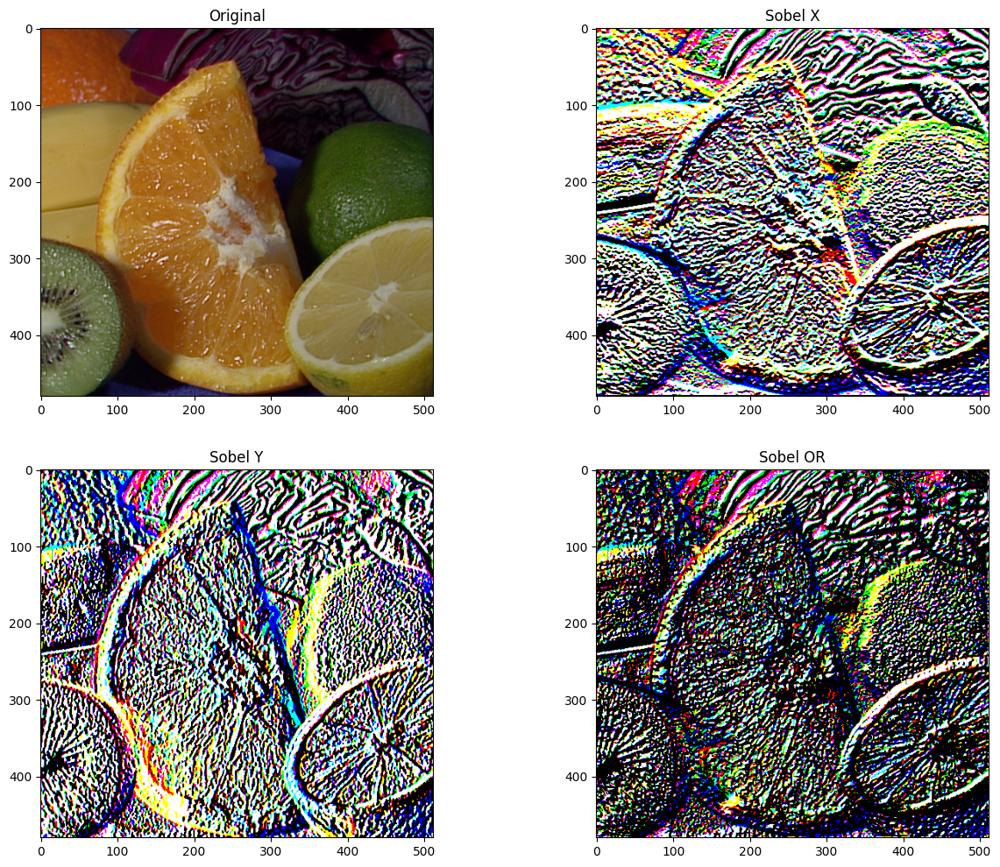

In [ ]:
# Get Sobel Edges
sobel_x = cv2.Sobel(fruits_img2, cv2.CV_64F, 0, 1, ksize=5)
sobel_y = cv2.Sobel(fruits_img2, cv2.CV_64F, 1, 0, ksize=5)

plt.figure(figsize=(15, 12))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(fruits_img2)

plt.subplot(2, 2, 2)
plt.title("Sobel X")
plt.imshow(sobel_x)

plt.subplot(2, 2, 3)
plt.title("Sobel Y")
plt.imshow(sobel_y)

sobel_OR = cv2.bitwise_or(sobel_x, sobel_y)

plt.subplot(2, 2, 4)
plt.title("Sobel OR")
plt.imshow(sobel_OR)

plt.show()

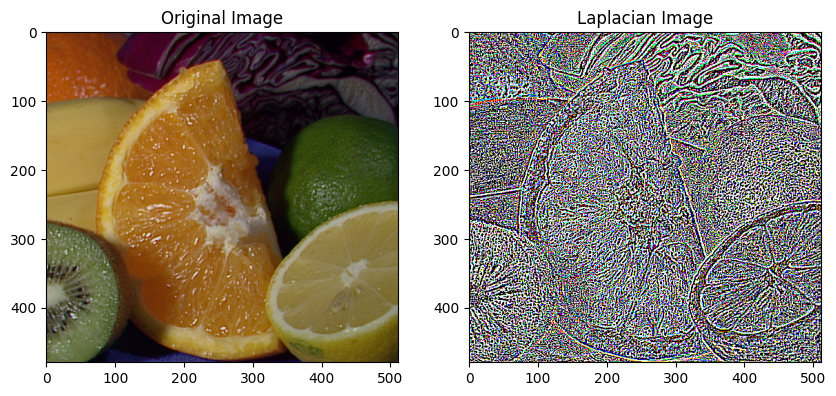

In [ ]:
# Laplacian
laplacian = cv2.Laplacian(fruits_img2, cv2.CV_64F)

# Compare with original image
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(fruits_img2)
axs[0].set_title('Original Image')
axs[1].imshow(laplacian)
axs[1].set_title('Laplacian Image')
plt.show()

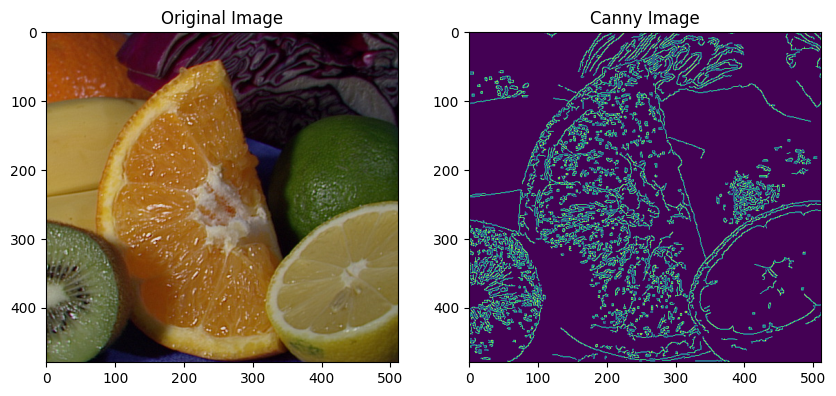

In [ ]:
# Canny Edge Detection uses gradient values as thresholds
canny = cv2.Canny(fruits_img2, 100, 200)

# Compare with original image
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(fruits_img2)
axs[0].set_title('Original Image')
axs[1].imshow(canny)
axs[1].set_title('Canny Image')
plt.show()


## Line Detection

In OpenCV, line detection focuses on identifying and extracting straight lines within an image. This is achieved by processing the image to highlight edges (often using techniques like Canny edge detection) and then applying algorithms like Hough Line Transform that search for patterns consistent with lines. These detected lines can be crucial for various computer vision applications, such as analyzing road markings in self-driving car systems, recognizing architectural elements in images, or interpreting geometric shapes in industrial automation.

cv2.HoughLines(binarized/thresholded image, 𝜌 accuracy, 𝜃 accuracy, threshold)


In [ ]:
sudoku_img = cv2.imread('/content/image_data/sudoku.png')
sudoku_img = cv2.cvtColor(sudoku_img, cv2.COLOR_BGR2RGB)

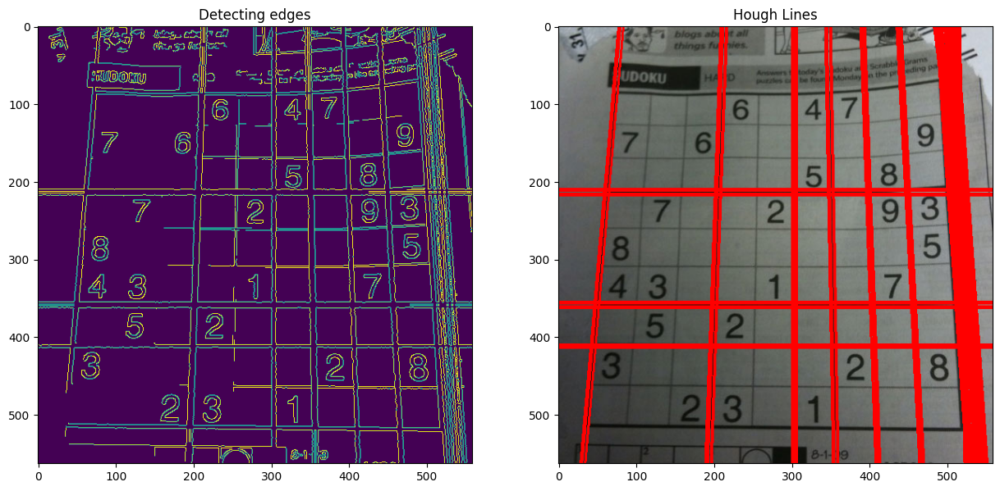

In [ ]:
plt.figure(figsize=(15, 20))

# Grayscale and Canny Edges extracted
gray = cv2.cvtColor(sudoku_img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)

plt.subplot(2, 2, 1)
plt.title("Detecting edges")
plt.imshow(edges)

# Run HoughLines using a rho accuracy of 1 pixel
# theta accuracy of np.pi / 180 which is 1 degree
# Our line threshold is set to 240 (number of points on line)
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)

# We iterate through each line and convert it to the format
# required by cv.lines (i.e. requiring end points)
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(sudoku_img, (x1, y1), (x2, y2), (255, 0, 0), 2)


plt.subplot(2, 2, 2)
plt.title("Hough Lines")
plt.imshow(sudoku_img)

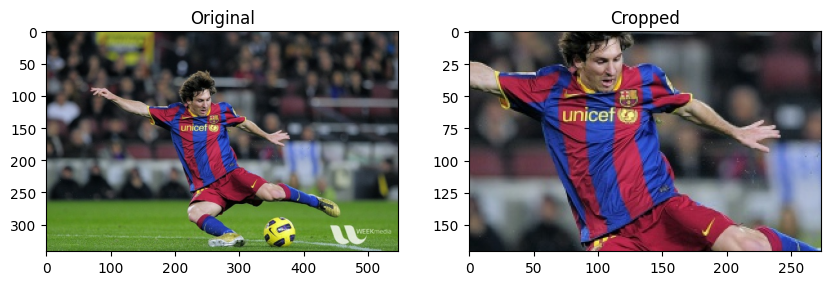

In [ ]:
messi_image = cv2.imread('/content/image_data/messi5.jpg')
messi_image = cv2.cvtColor(messi_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(messi_image)

height, width = messi_image.shape[:2]

# Let's get the starting pixel coordiantes (top  left of cropping rectangle)
start_row, start_col = int(height * .25), int(width * .25)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .75), int(width * .75)

# Simply use indexing to crop out the rectangle we desire
cropped = messi_image[start_row:end_row , start_col:end_col]


plt.subplot(2, 2, 2)
plt.title("Cropped")
plt.imshow(cropped)


## Morphological Operations

OpenCV's image morphological operations (erosion, dilation, etc.) analyze image shapes by shrinking or expanding objects and are used for noise reduction, enhancement, and object recognition in computer vision.




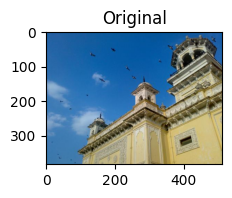

In [ ]:
# Read the image
home_img = cv2.imread('/content/image_data/home.jpg')
home_img = cv2.cvtColor(home_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5, 5))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(home_img)

In [ ]:
# Convert the image to grayscale
gray = cv2.cvtColor(home_img, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding to obtain a binary image
ret, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# Define the structuring element
kernel = np.ones((5,5), np.uint8)

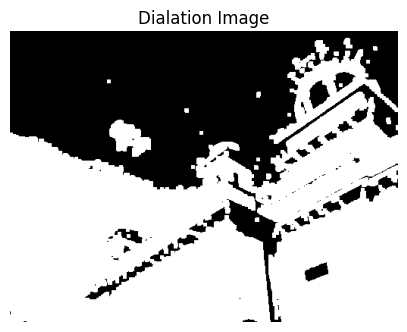

In [ ]:
# Apply dilation to the binary image
dilation = cv2.dilate(binary, kernel, iterations=1)

plt.figure(figsize=(5, 5))
plt.imshow(dilation, cmap='gray')
plt.title('Dialation Image')
plt.axis('off')
plt.show()

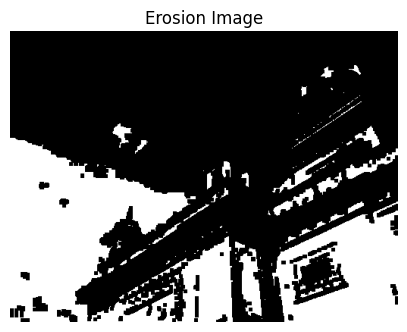

In [ ]:
# Apply erosion to the binary image
erosion = cv2.erode(binary, kernel, iterations=1)

plt.figure(figsize=(5, 5))
plt.imshow(erosion, cmap='gray')
plt.title('Erosion Image')
plt.axis('off')
plt.show()

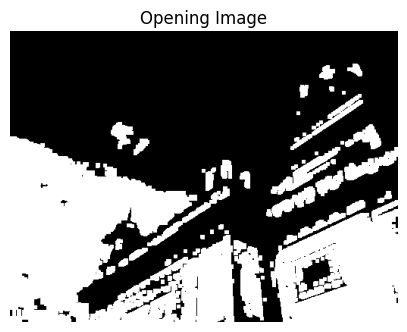

In [ ]:
# Apply opening to the binary image
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(5, 5))
plt.imshow(opening, cmap='gray')
plt.title('Opening Image')
plt.axis('off')
plt.show()

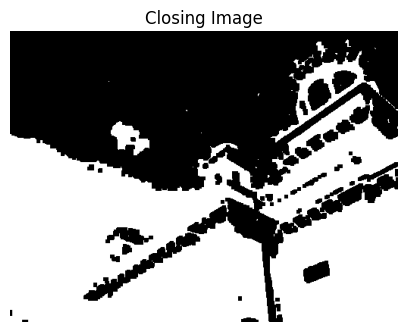

In [ ]:
# Apply closing to the binary image
closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

plt.figure(figsize=(5, 5))
plt.imshow(closing, cmap='gray')
plt.title('Closing Image')
plt.axis('off')
plt.show()

## Background Subtraction Methods

Background subtraction (BS) is a common and widely used technique for generating a foreground mask (namely, a binary image containing the pixels belonging to moving objects in the scene) by using static cameras.

As the name suggests, BS calculates the foreground mask performing a subtraction between the current frame and a background model, containing the static part of the scene or, more in general, everything that can be considered as background given the characteristics of the observed scene.

![](https://docs.opencv.org/3.4/Background_Subtraction_Tutorial_Scheme.png)


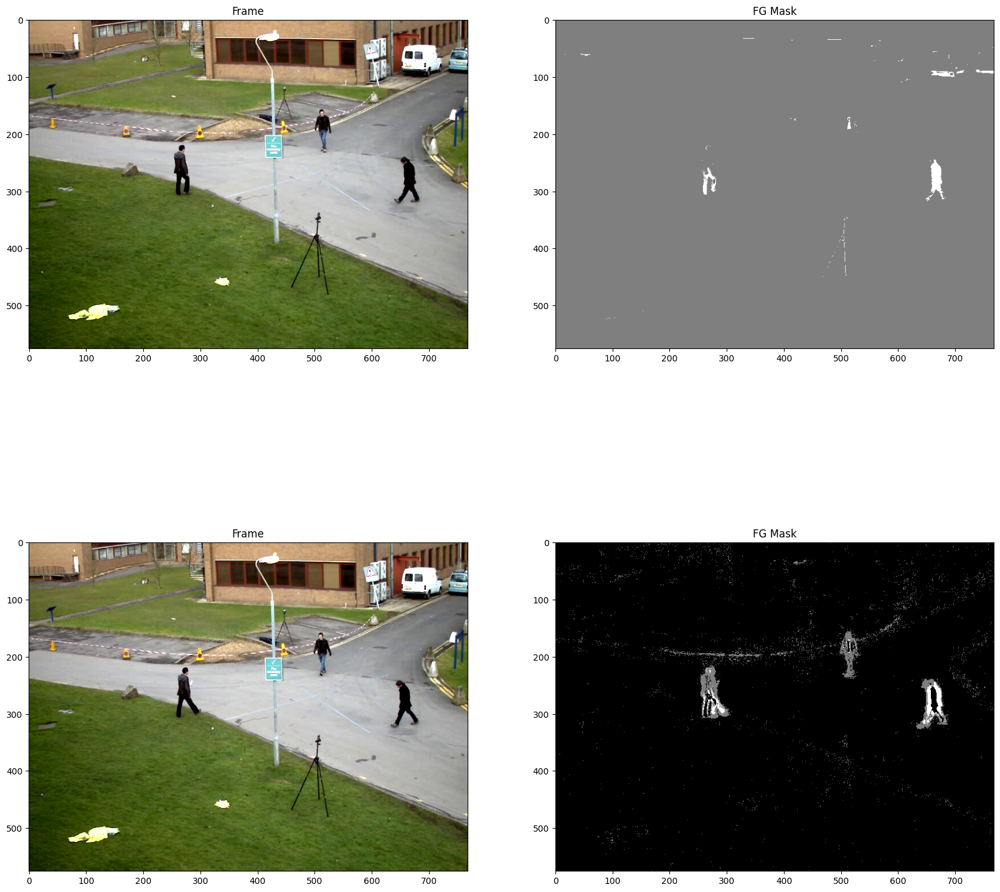

In [ ]:
import cv2
import matplotlib.pyplot as plt

algo = 'MOG2'

if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

plt.figure(figsize=(20, 20))

frame = cv2.imread('/content/image_data/Background_Subtraction_Tutorial_frame.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 1)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 2)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

frame = cv2.imread('/content/image_data/Background_Subtraction_Tutorial_frame_1.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 3)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 4)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

## Face and Eye Detection Haar Cascades


In [ ]:
# Download the test image and utils files
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml \
    -O haarcascade_frontalface_default.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_smile.xml \
    -O haarcascade_smile.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_eye.xml \
    -O haarcascade_eye.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py

# these imports let you use opencv
import cv2 #opencv itself
import common #some useful opencv functions
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
%matplotlib inline
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size

--2024-06-29 01:15:17--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.06s   

2024-06-29 01:15:17 (14.8 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]

--2024-06-29 01:15:17--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_smile.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercont

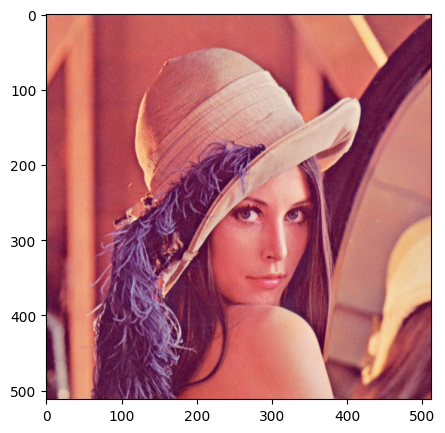

In [ ]:
# Load the messi image and create a greyscale copy of it to be used in the classifiers
fig, axs = plt.subplots(1, 1, figsize=(5, 5))
lena_image1 = cv2.imread('/content/image_data/lena.jpg')
grey = cv2.cvtColor(lena_image1, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(lena_image1, cv2.COLOR_BGR2RGB))

Face Detection

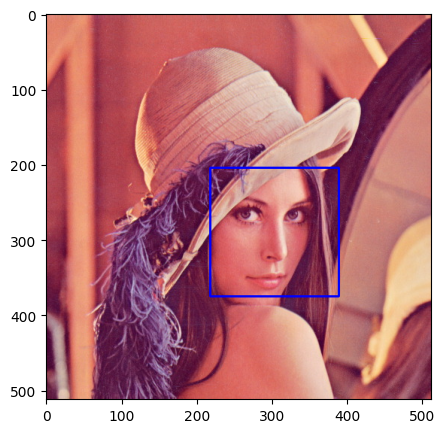

In [ ]:
# this is a pre-trained face cascade
lena_image1 = cv2.imread('/content/image_data/lena.jpg')
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
fig, axs = plt.subplots(1, 1, figsize=(5, 5))
faces = face_cascade.detectMultiScale(grey, 1.3, 5)
for (x,y,w,h) in faces:
     cv2.rectangle(lena_image1,(x,y),(x+w,y+h),(255,0,0),2)
plt.imshow(cv2.cvtColor(lena_image1, cv2.COLOR_BGR2RGB))

Eye detection

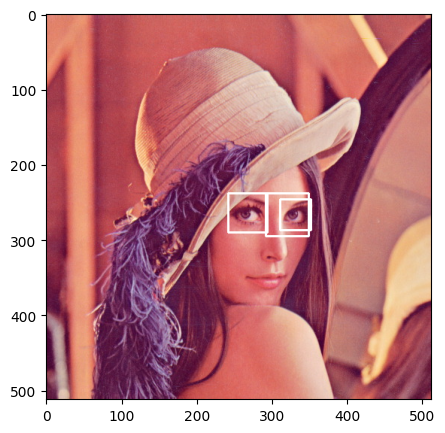

In [ ]:
# this is a pre-trained face cascade
lena_image1 = cv2.imread('/content/image_data/lena.jpg')
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
eyes = eye_cascade.detectMultiScale(grey, 1.3, 1)
plt.figure(figsize=(5, 5))
for (x,y,w,h) in eyes:
     cv2.rectangle(lena_image1,(x,y),(x+w,y+h),(255,255,255),2)
plt.imshow(cv2.cvtColor(lena_image1, cv2.COLOR_BGR2RGB))

## Playing with Video (Optional)
- Please try on your local computer, google collab currently doesn't support video playback with open CV

In [ ]:
# Create a VideoCapture object and read from input file
cap = cv2.VideoCapture('/content/image_data/tree.avi')

# Check if camera opened successfully
if (cap.isOpened()== False):
    print("Error opening video file")

# Read until video is completed
while(cap.isOpened()):

# Capture frame-by-frame
    ret, frame = cap.read()
    if ret == True:
    # Display the resulting frame
        cv2.imshow('Frame', frame)

    # Press Q on keyboard to exit
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break

# Break the loop
    else:
        break

# When everything done, release
# the video capture object
cap.release()

# Closes all the frames
cv2.destroyAllWindows()